The PP4AV dataset was used in this experiment, with ResNet-50 as the backbone for both the teacher and student models.
FCOS was used as the teacher model; CrossKD and LD were both distilled from the same teacher.
All models were trained using a 2x schedule (24 epochs), and most training parameters were kept the same. The optimizer used was SGD, IoU=0.5.

In [5]:
import torch

ckpt = torch.load('work_dirs/crosskd_r50_fcos_pp4av/epoch_10.pth', map_location='cpu')

state_dict = ckpt.get('state_dict', ckpt) 

from collections import Counter
dtype_counts = Counter()

for name, tensor in state_dict.items():
    if isinstance(tensor, torch.Tensor):
        dtype_counts[str(tensor.dtype)] += 1

print("Data type distribution in checkpoint:")
for dtype, count in dtype_counts.items():
    print(f"{dtype}: {count} tensors")


Data type distribution in checkpoint:
torch.float32: 810 tensors
torch.int64: 323 tensors
torch.int32: 159 tensors


In [3]:
import importlib, mmdeploy
print('mmdeploy', mmdeploy.__version__)
print('nncf sub-pkg:',
      bool(importlib.util.find_spec("mmdeploy.apis.nncf")))


mmdeploy 1.3.1
nncf sub-pkg: False


<IPython.core.display.Javascript object>


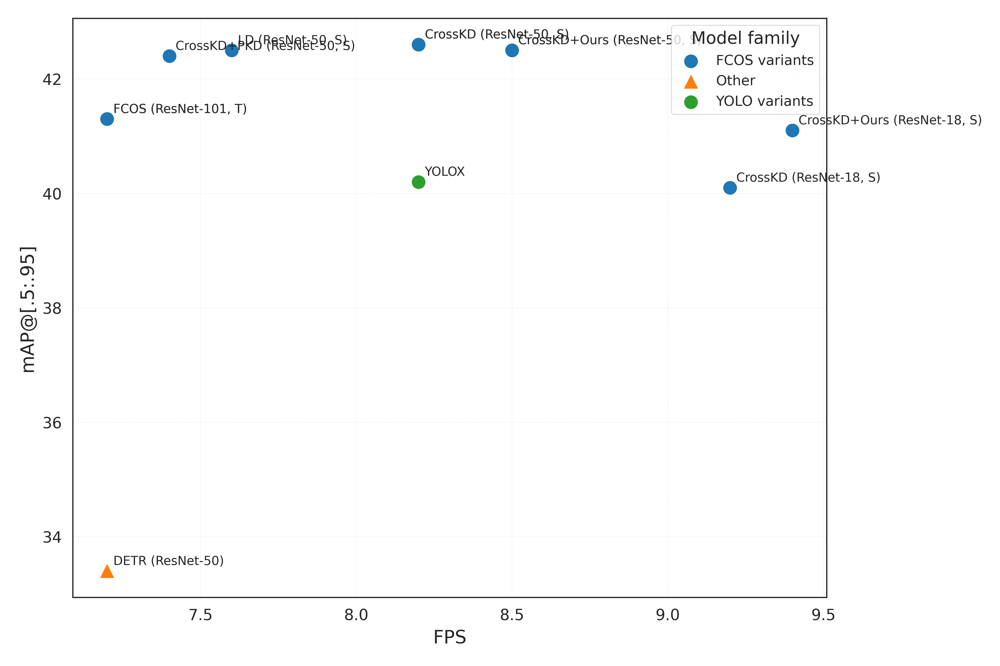

In [147]:
import pandas as pd
import matplotlib.pyplot as plt

data = [
    # First table (smaller backbone detailed comparison)
    {"Model": "FCOS (ResNet-101, T)",       "mAP": 41.3, "FPS": 7.2, "Family": "FCOS variants"},
    {"Model": "CrossKD (ResNet-50, S)",     "mAP": 42.6, "FPS": 8.2, "Family": "FCOS variants"},
    {"Model": "CrossKD+Ours (ResNet-50, S)","mAP": 42.5, "FPS": 8.5, "Family": "FCOS variants"},
    {"Model": "CrossKD (ResNet-18, S)",     "mAP": 40.1, "FPS": 9.2, "Family": "FCOS variants"},
    {"Model": "CrossKD+Ours (ResNet-18, S)","mAP": 41.1, "FPS": 9.4, "Family": "FCOS variants"},

    # Second table (Accuracy vs efficiency on PP4AV)
    {"Model": "FCOS (ResNet-101, T)",       "mAP": 41.3, "FPS": 7.2, "Family": "FCOS variants"},
    {"Model": "CrossKD (ResNet-50, S)",     "mAP": 42.6, "FPS": 8.2, "Family": "FCOS variants"},
    {"Model": "CrossKD+Ours (ResNet-50, S)","mAP": 42.5, "FPS": 8.5, "Family": "FCOS variants"},
    {"Model": "CrossKD+PKD (ResNet-50, S)","mAP": 42.4, "FPS": 7.4, "Family": "FCOS variants"},
    {"Model": "LD (ResNet-50, S)",          "mAP": 42.5, "FPS": 7.6, "Family": "FCOS variants"},
    {"Model": "YOLOX",                      "mAP": 40.2, "FPS": 8.2, "Family": "YOLO variants"},
    {"Model": "DETR (ResNet-50)",           "mAP": 33.4, "FPS": 7.2, "Family": "Other"},
]


df = pd.DataFrame(data)

marker_map = {"FCOS variants": "o", "YOLO variants": "s", "Other": "^"}

plt.figure(figsize=(9, 6), dpi=300)

for family, group in df.groupby("Family"):
    plt.scatter(group["FPS"], group["mAP"], marker=marker_map.get(family, "o"), label=family, s=70)

for _, row in df.iterrows():
    plt.annotate(row["Model"], (row["FPS"], row["mAP"]),
                 xytext=(4, 4), textcoords="offset points", fontsize=8)

# plt.title("Speed–Accuracy Trade‑off of Detectors", fontsize=14)
plt.xlabel("FPS", fontsize=12)
plt.ylabel("mAP@[.5:.95]", fontsize=12)
plt.grid(True, linestyle=":", linewidth=0.5)
plt.legend(title="Model family", fontsize=9)
plt.tight_layout()

png_path = "results/speed_accuracy_tradeoff.png"
# plt.savefig(png_path, bbox_inches="tight")
plt.show()




In [29]:
import sys
from types import SimpleNamespace
import matplotlib.pyplot as plt
from mmdet.apis import init_detector, inference_detector
from mmdet.utils import register_all_modules
from mmdet.registry import VISUALIZERS
from mmdet.apis import DetInferencer
from mmengine.visualization import Visualizer
import matplotlib.pyplot as plt
import cv2

import mmcv
from tools.analysis_tools.analyze_logs import *
# %matplotlib notebook
sys.path.append('/Ziob/343312/AVD-Anonymizer/CrossKD/tools/analysis_tools')



In [24]:
fcos_cfg = 'configs/fcos/fcos_r101-caffe_fpn_gn-head-1x_coco.py'
fcos_pth = 'work_dirs/fcos_r101-caffe_fpn_gn-head-1x_coco/exp_2/epoch_24.pth'


crosskd_uet_cfg = 'configs/crosskd/crosskd_r50_fcos_pp4av.py'
crosskd_uet_pth = 'work_dirs/crosskd_r50_fcos_pp4av/exp_2/epoch_24.pth'

crosskd_cfg = 'configs/crosskd/crosskd_r50_fcos_r50-2x-ms_pp4av.py'
crosskd_pth = 'work_dirs/crosskd_r50_fcos_r50-2x-ms_pp4av/exp_2/epoch_24.pth'

ld_cfg = 'configs/ld/ld_r50_pp4av.py'
ld_pth = 'work_dirs/ld_r50_pp4av/exp_2/epoch_24.pth'

crosskd_pkd_cfg = 'configs/crosskd+pkd/crosskd+pkd_r50_fcos_r101-2x-ms_caffe_fpn_gn-head_2x_ms_coco.py'
crosskd_pkd_pth = 'work_dirs/crosskd+pkd_r50_fcos_r101-2x-ms_caffe_fpn_gn-head_2x_ms_coco/exp_2/epoch_24.pth'


crosskd_r18_cfg = 'configs/crosskd/crosskd_r18_fcos.py'
crosskd_r18_pth = 'work_dirs/crosskd_r18_fcos/exp_2/epoch_24.pth'

crosskd_r18_uet_cfg = 'configs/crosskd/crosskd_r18_fcos_mc.py'
crosskd_r18_uet_pth = 'work_dirs/crosskd_r18_fcos_mc/exp_1/epoch_24.pth'



In [14]:
register_all_modules()
fcos_model = init_detector(fcos_cfg, fcos_pth, device='cuda:0')
crosskd_model = init_detector(crosskd_cfg, crosskd_pth, device='cuda:0')
crosskd_uet_model = init_detector(crosskd_uet_cfg, crosskd_uet_pth, device='cuda:0')
ld_model = init_detector(ld_cfg, ld_pth, device='cuda:0')
# crosskd_pkd_model = init_detector(crosskd_pkd_cfg, crosskd_pkd_pth, device='cuda:0')
crosskd_r18_model = init_detector(crosskd_r18_cfg, crosskd_r18_pth, device='cuda:0')
crosskd_r18_uet_model = init_detector(crosskd_r18_cfg, crosskd_r18_pth, device='cuda:0')

Loads checkpoint by local backend from path: work_dirs/fcos_r101-caffe_fpn_gn-head-1x_coco/exp_2/epoch_24.pth
Loads checkpoint by local backend from path: work_dirs/fcos_r101-caffe_fpn_gn-head-1x_coco/exp_1/epoch_24.pth
Loads checkpoint by local backend from path: work_dirs/crosskd_r50_fcos_r50-2x-ms_pp4av/exp_2/epoch_24.pth
Loads checkpoint by local backend from path: work_dirs/fcos_r101-caffe_fpn_gn-head-1x_coco/exp_2/epoch_24.pth
Loads checkpoint by local backend from path: work_dirs/crosskd_r50_fcos_pp4av/exp_2/epoch_24.pth


/Ziob/343312/AVD-Anonymizer/CrossKD/mmdet/models/dense_heads/anchor_head.py:108: UserWarning: DeprecationWarning: `num_anchors` is deprecated, for consistency or also use `num_base_priors` instead
  warnings.warn('DeprecationWarning: `num_anchors` is deprecated, '


Loads checkpoint by local backend from path: work_dirs/fcos_r101-caffe_fpn_gn-head-1x_coco/exp_1/epoch_24.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: backbone.layer3.6.conv1.weight, backbone.layer3.6.bn1.weight, backbone.layer3.6.bn1.bias, backbone.layer3.6.bn1.running_mean, backbone.layer3.6.bn1.running_var, backbone.layer3.6.bn1.num_batches_tracked, backbone.layer3.6.conv2.weight, backbone.layer3.6.bn2.weight, backbone.layer3.6.bn2.bias, backbone.layer3.6.bn2.running_mean, backbone.layer3.6.bn2.running_var, backbone.layer3.6.bn2.num_batches_tracked, backbone.layer3.6.conv3.weight, backbone.layer3.6.bn3.weight, backbone.layer3.6.bn3.bias, backbone.layer3.6.bn3.running_mean, backbone.layer3.6.bn3.running_var, backbone.layer3.6.bn3.num_batches_tracked, backbone.layer3.7.conv1.weight, backbone.layer3.7.bn1.weight, backbone.layer3.7.bn1.bias, backbone.layer3.7.bn1.running_mean, backbone.layer3.7.bn1.running_var, backbone.layer3.7.bn1.num_

Loads checkpoint by local backend from path: work_dirs/fcos_r101-caffe_fpn_gn-head-1x_coco/exp_1/epoch_24.pth
Loads checkpoint by local backend from path: work_dirs/crosskd_r18_fcos/exp_2/epoch_24.pth
Loads checkpoint by local backend from path: work_dirs/fcos_r101-caffe_fpn_gn-head-1x_coco/exp_1/epoch_24.pth
Loads checkpoint by local backend from path: work_dirs/crosskd_r18_fcos/exp_2/epoch_24.pth


In [20]:
from mmdet.apis import DetInferencer

inferencer_fcos = DetInferencer(model=fcos_cfg, weights=fcos_pth, device='cuda:0', palette=(0, 255, 0))
inferencer_crosskd_uet = DetInferencer(model=crosskd_uet_cfg, weights=crosskd_uet_pth, device='cuda:0', palette=(0, 255, 0))
inferencer_crosskd = DetInferencer(model=crosskd_cfg, weights=crosskd_pth, device='cuda:0', palette=(0, 255, 0))
inferencer_ld = DetInferencer(model=ld_cfg, weights=ld_pth, device='cuda:0', palette=(0, 255, 0))
inferencer_crosskd_pkd = DetInferencer(model=crosskd_pkd_cfg, weights=crosskd_pkd_pth, device='cuda:0', palette=(0, 255, 0))


Loads checkpoint by local backend from path: work_dirs/fcos_r101-caffe_fpn_gn-head-1x_coco/exp_2/epoch_24.pth
Loads checkpoint by local backend from path: work_dirs/crosskd_r50_fcos_pp4av/exp_2/epoch_24.pth
Loads checkpoint by local backend from path: work_dirs/fcos_r101-caffe_fpn_gn-head-1x_coco/exp_2/epoch_24.pth
Loads checkpoint by local backend from path: work_dirs/crosskd_r50_fcos_r50-2x-ms_pp4av/exp_2/epoch_24.pth
Loads checkpoint by local backend from path: work_dirs/fcos_r101-caffe_fpn_gn-head-1x_coco/exp_1/epoch_24.pth
Loads checkpoint by local backend from path: work_dirs/ld_r50_pp4av/exp_2/epoch_24.pth
Loads checkpoint by local backend from path: work_dirs/fcos_r101-caffe_fpn_gn-head-1x_coco/exp_1/epoch_24.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: backbone.layer3.6.conv1.weight, backbone.layer3.6.bn1.weight, backbone.layer3.6.bn1.bias, backbone.layer3.6.bn1.running_mean, backbone.layer3.6.bn1.running_var, backbone.layer3.6

NameError: name 'crosskd_pkd_cfg' is not defined

In [25]:
inferencer_fcos = DetInferencer(model=fcos_cfg, weights=fcos_pth, device='cuda:0', palette=(0, 255, 0))
inferencer_crosskd = DetInferencer(model=crosskd_cfg, weights=crosskd_pth, device='cuda:0', palette=(0, 255, 0))
inferencer_crosskd_uet = DetInferencer(model=crosskd_uet_cfg, weights=crosskd_uet_pth, device='cuda:0', palette=(0, 255, 0))
inferencer_r18_crosskd = DetInferencer(model=crosskd_r18_cfg, weights=crosskd_r18_pth, device='cuda:0', palette=(0, 255, 0))
inferencer_r18_crosskd_uet = DetInferencer(model=crosskd_r18_uet_cfg, weights=crosskd_r18_uet_pth, device='cuda:0', palette=(0, 255, 0))

Loads checkpoint by local backend from path: work_dirs/fcos_r101-caffe_fpn_gn-head-1x_coco/exp_2/epoch_24.pth
Loads checkpoint by local backend from path: work_dirs/crosskd_r50_fcos_r50-2x-ms_pp4av/exp_2/epoch_24.pth
Loads checkpoint by local backend from path: work_dirs/fcos_r101-caffe_fpn_gn-head-1x_coco/exp_1/epoch_24.pth
Loads checkpoint by local backend from path: work_dirs/crosskd_r50_fcos_pp4av/exp_2/epoch_24.pth
Loads checkpoint by local backend from path: work_dirs/fcos_r101-caffe_fpn_gn-head-1x_coco/exp_2/epoch_24.pth
Loads checkpoint by local backend from path: work_dirs/crosskd_r18_fcos/exp_2/epoch_24.pth
Loads checkpoint by local backend from path: work_dirs/fcos_r101-caffe_fpn_gn-head-1x_coco/exp_1/epoch_24.pth
Loads checkpoint by local backend from path: work_dirs/crosskd_r18_fcos_mc/exp_1/epoch_24.pth
Loads checkpoint by local backend from path: work_dirs/fcos_r101-caffe_fpn_gn-head-1x_coco/exp_1/epoch_24.pth


<IPython.core.display.Javascript object>


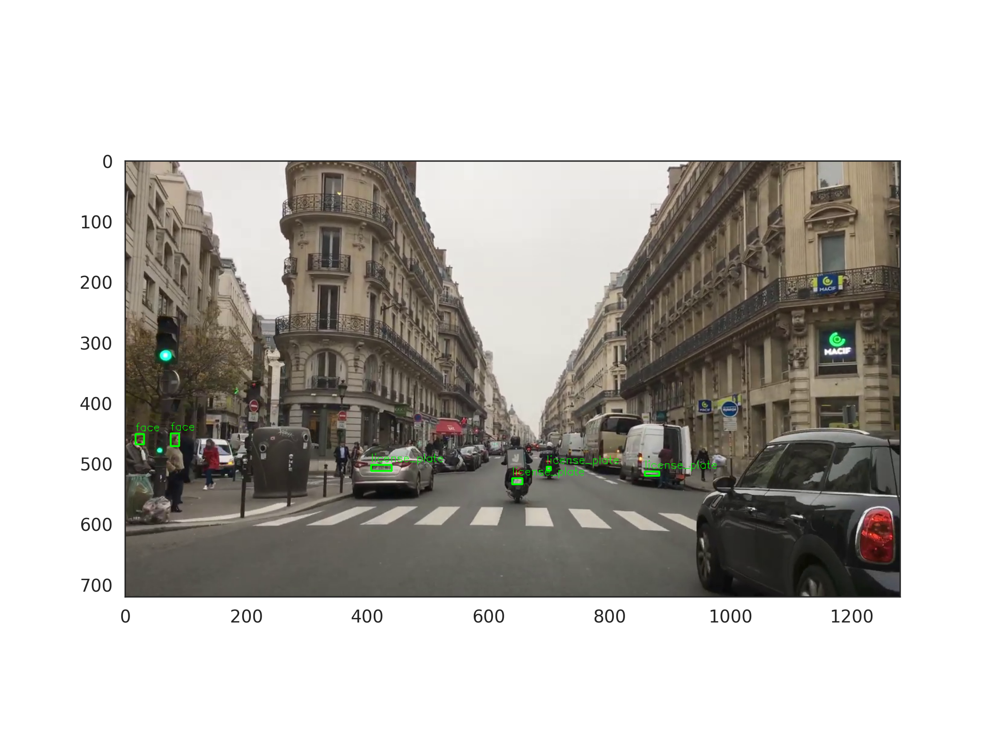

In [150]:
import cv2
import os
import matplotlib.pyplot as plt

def plot_yolo_boxes(image_path, label_path, class_names=None, save_path=None):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    h, w, _ = image.shape

    with open(label_path, 'r') as f:
        lines = f.readlines()

    for line in lines:
        parts = line.strip().split()
        class_id = int(parts[0])
        x_center, y_center, width, height = map(float, parts[1:])
        x1 = int((x_center - width / 2) * w)
        y1 = int((y_center - height / 2) * h)
        x2 = int((x_center + width / 2) * w)
        y2 = int((y_center + height / 2) * h)
        color = (0, 255, 0)
        cv2.rectangle(image, (x1, y1), (x2, y2), color, 2)
        if class_names:
            cv2.putText(image, class_names[class_id], (x1, y1 - 5),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 1)


    if save_path:
        image_bgr = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
        cv2.imwrite(save_path, image_bgr)
    plt.figure(figsize=(8, 6))
    plt.imshow(image)
    return image


# img = 'frame_001080.png'
# img ='frame_003025.png'
# img = '00090_MVL.png'
# img = 'frame_002795.png'


img_path = os.path.join('data/pp4av_dataset/val', img)
label_path = os.path.join('data/pp4av_dataset/labels/val', img.replace('.png', '.txt'))
save_path = os.path.join('results', img)

ground_true = plot_yolo_boxes(
    img_path,
    label_path,
    class_names=["face", "license_plate"],
    save_path=save_path
)



<IPython.core.display.Javascript object>


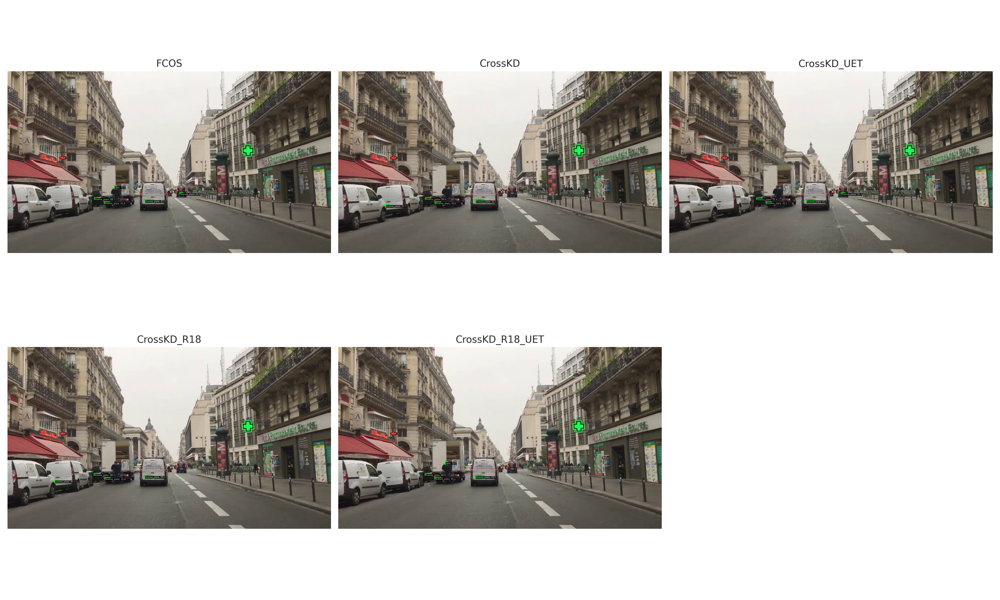

Output()

Output()

Output()

Output()

Output()

In [64]:
import os
import cv2
import matplotlib.pyplot as plt


output_dir = 'output/'
os.makedirs(output_dir, exist_ok=True)

inferencers = {
    'FCOS': inferencer_fcos,
    'CrossKD': inferencer_crosskd,
    'CrossKD_UET': inferencer_crosskd_uet,
    'CrossKD_R18': inferencer_r18_crosskd,
    'CrossKD_R18_UET': inferencer_r18_crosskd_uet
}


plt.figure(figsize=(20, 12))

for idx, (name, inferencer) in enumerate(inferencers.items(), 1):
    result = inferencer(inputs=img_path, show=False, return_vis=True)
    vis_img = result['visualization'][0]

#     save_path = os.path.join(output_dir, img+f'{name.replace(" ", "_").replace("+", "plus").replace("(", "").replace(")", "").lower()}.jpg')
#     cv2.imwrite(save_path, vis_img[:, :, ::-1])  # RGB to BGR for OpenCV

    plt.subplot(2, 3, idx)
    plt.imshow(vis_img)
    plt.axis('off')
    plt.title(name, fontsize=14)

plt.tight_layout()
plt.show()


Output()

<IPython.core.display.Javascript object>


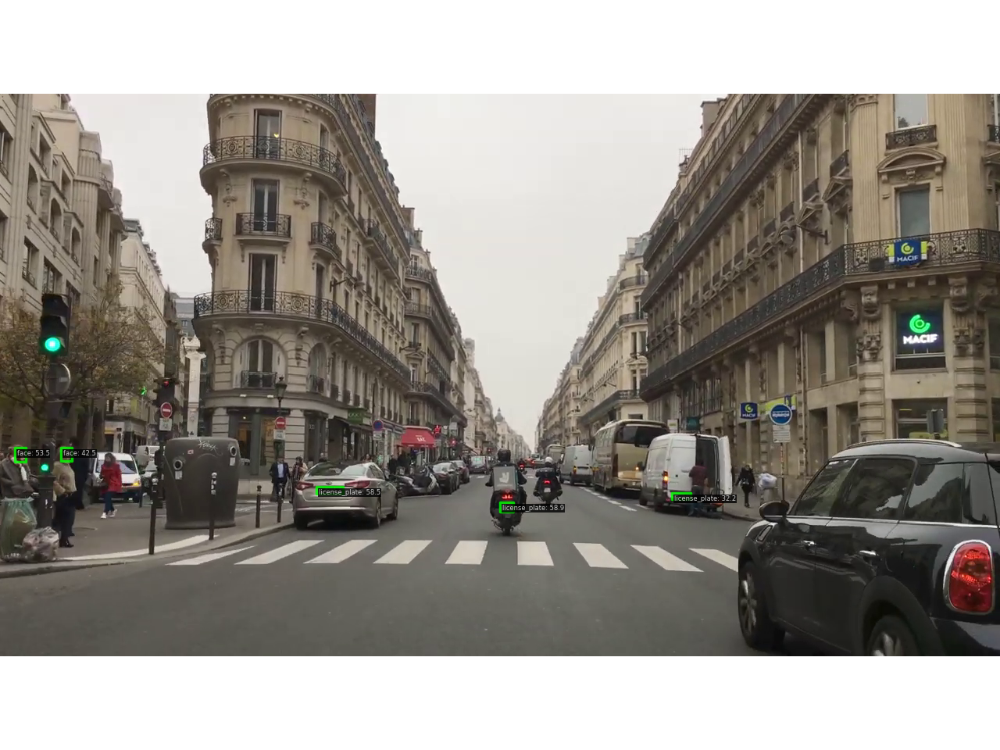

KeyboardInterrupt: 

In [27]:
result = inferencer(inputs=img_path, show=True)

vis_img = result['visualization'][0]


# save_path = '02987_RV_YOLOX.jpg'
# cv2.imwrite(save_path, cv2.cvtColor(vis_img, cv2.COLOR_RGB2BGR)) 

plt.figure(figsize=(10, 8))
plt.imshow(vis_img)
plt.axis('off')
plt.title('Detection Result')
plt.show()



<IPython.core.display.Javascript object>


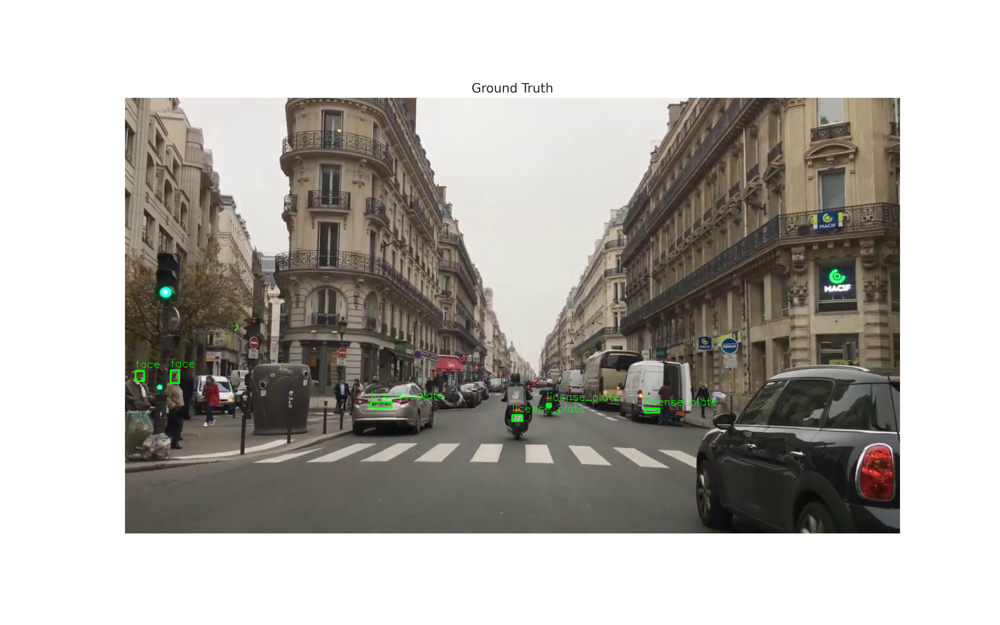

<IPython.core.display.Javascript object>


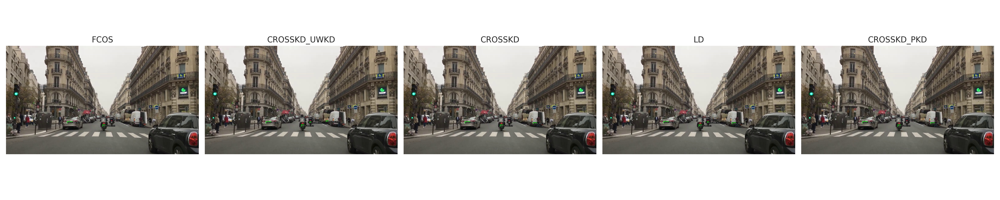

In [157]:
import os
import mmcv
import matplotlib.pyplot as plt

# Read image
img = mmcv.imread(img_path, channel_order='rgb')

# Show ground truth (if available)
plt.figure(figsize=(16, 10))
plt.imshow(ground_true)
plt.title('Ground Truth')
plt.axis('off')
plt.show()

# Output directory for predictions
save_dir = 'outputs/predictions'
os.makedirs(save_dir, exist_ok=True)

# Models to evaluate
models = [
    (fcos_model, "fcos"),
    (crosskd_uet_model, "crosskd_uwkd"),
    (crosskd_model, "crosskd"),
    (ld_model, "ld"),
    (crosskd_pkd_model, "crosskd_pkd"),
]

# Display all models in one row
fig, axes = plt.subplots(1, len(models), figsize=(5 * len(models), 5))
if len(models) == 1:
    axes = [axes]

for idx, (model, name) in enumerate(models):
    result = inference_detector(model, img)

    visualizer = VISUALIZERS.build(model.cfg.visualizer)
    visualizer.dataset_meta = model.dataset_meta

    img_copy = img.copy()
    visualizer.add_datasample(
        name,
        img_copy,
        data_sample=result,
        draw_gt=False,
        wait_time=0
    )

    vis_img = visualizer.get_image()

    # Save the visualized result
    save_path = os.path.join(save_dir, f"02987_RV_{name}.jpg")
    mmcv.imwrite(vis_img[..., ::-1], save_path)  # RGB → BGR for saving

    # Show the result
    axes[idx].imshow(vis_img)
    axes[idx].set_title(f'{name.upper()}')
    axes[idx].axis('off')

plt.tight_layout()
plt.show()


### parameter size

In [30]:
from mmengine.config import Config
from mmengine.runner import load_checkpoint
from mmdet.utils import register_all_modules
from mmdet.registry import MODELS

def count_params(model):
    total = sum(p.numel() for p in model.parameters())
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
    return total, trainable

# Register MMDetection modules and set default scope
register_all_modules(init_default_scope=True)


models_info = [
    ('fcos', 
     'configs/fcos/fcos_r101-caffe_fpn_gn-head-1x_coco.py',
     'work_dirs/fcos_r101-caffe_fpn_gn-head-1x_coco/exp_2/epoch_24.pth'),

    ('crosskd_uet',
     'configs/crosskd/crosskd_r50_fcos_pp4av.py',
     'work_dirs/crosskd_r50_fcos_pp4av/exp_2/epoch_24.pth'),

    ('crosskd',
     'configs/crosskd/crosskd_r50_fcos_r50-2x-ms_pp4av.py',
     'work_dirs/crosskd_r50_fcos_r50-2x-ms_pp4av/exp_2/epoch_24.pth'),

    ('ld',
     'configs/ld/ld_r50_pp4av.py',
     'work_dirs/ld_r50_pp4av/exp_2/epoch_24.pth'),

    ('crosskd_pkd',
     'configs/crosskd+pkd/crosskd+pkd_r50_fcos_r101-2x_coco.py',
     'work_dirs/crosskd+pkd_r50_fcos_r101-2x_coco/exp_2/epoch_24.pth'),

    ('crosskd_r18',
     'configs/crosskd/crosskd_r18_fcos.py',
     'work_dirs/crosskd_r18_fcos/exp_2/epoch_24.pth'),

    ('crosskd_r18_uet',
     'configs/crosskd/crosskd_r18_fcos_mc.py',
     'work_dirs/crosskd_r18_fcos_mc/exp_1/epoch_24.pth'),
]

for name, cfg_path, ckpt_path in models_info:
    print(f"\n{name} model:")
    cfg = Config.fromfile(cfg_path)

    model = MODELS.build(cfg.model)

    try:
        load_checkpoint(model, ckpt_path, map_location='cpu', revise_keys=[(r'^module\.', '')])
    except Exception as e:
        print(f"  Note: failed to load checkpoint ({e}). Counting params on init weights.")

    total, trainable = count_params(model)
    print(f"  Total params:     {total:,} ({total/1e6:.2f}M)")
    print(f"  Trainable params: {trainable:,} ({trainable/1e6:.2f}M)")


fcos model:
Loads checkpoint by local backend from path: work_dirs/fcos_r101-caffe_fpn_gn-head-1x_coco/exp_2/epoch_24.pth
  Total params:     51,173,452 (51.17M)
  Trainable params: 50,845,708 (50.85M)

crosskd_uet model:
Loads checkpoint by local backend from path: work_dirs/fcos_r101-caffe_fpn_gn-head-1x_coco/exp_2/epoch_24.pth
Loads checkpoint by local backend from path: work_dirs/crosskd_r50_fcos_pp4av/exp_2/epoch_24.pth
  Total params:     32,181,324 (32.18M)
  Trainable params: 31,905,804 (31.91M)

crosskd model:
Loads checkpoint by local backend from path: work_dirs/fcos_r101-caffe_fpn_gn-head-1x_coco/exp_1/epoch_24.pth
Loads checkpoint by local backend from path: work_dirs/crosskd_r50_fcos_r50-2x-ms_pp4av/exp_2/epoch_24.pth
  Total params:     32,181,324 (32.18M)
  Trainable params: 31,905,804 (31.91M)

ld model:


/Ziob/343312/AVD-Anonymizer/CrossKD/mmdet/models/dense_heads/anchor_head.py:108: UserWarning: DeprecationWarning: `num_anchors` is deprecated, for consistency or also use `num_base_priors` instead
  warnings.warn('DeprecationWarning: `num_anchors` is deprecated, '


Loads checkpoint by local backend from path: work_dirs/fcos_r101-caffe_fpn_gn-head-1x_coco/exp_1/epoch_24.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: backbone.layer3.6.conv1.weight, backbone.layer3.6.bn1.weight, backbone.layer3.6.bn1.bias, backbone.layer3.6.bn1.running_mean, backbone.layer3.6.bn1.running_var, backbone.layer3.6.bn1.num_batches_tracked, backbone.layer3.6.conv2.weight, backbone.layer3.6.bn2.weight, backbone.layer3.6.bn2.bias, backbone.layer3.6.bn2.running_mean, backbone.layer3.6.bn2.running_var, backbone.layer3.6.bn2.num_batches_tracked, backbone.layer3.6.conv3.weight, backbone.layer3.6.bn3.weight, backbone.layer3.6.bn3.bias, backbone.layer3.6.bn3.running_mean, backbone.layer3.6.bn3.running_var, backbone.layer3.6.bn3.num_batches_tracked, backbone.layer3.7.conv1.weight, backbone.layer3.7.bn1.weight, backbone.layer3.7.bn1.bias, backbone.layer3.7.bn1.running_mean, backbone.layer3.7.bn1.running_var, backbone.layer3.7.bn1.num_

  Total params:     32,326,539 (32.33M)
  Trainable params: 32,101,195 (32.10M)

crosskd_pkd model:
Loads checkpoint by local backend from path: work_dirs/fcos_r101-caffe_fpn_gn-head-1x_coco/exp_1/epoch_24.pth
Loads checkpoint by local backend from path: work_dirs/crosskd+pkd_r50_fcos_r101-2x_coco/exp_2/epoch_24.pth
  Total params:     32,181,324 (32.18M)
  Trainable params: 31,905,804 (31.91M)

crosskd_r18 model:
Loads checkpoint by local backend from path: work_dirs/fcos_r101-caffe_fpn_gn-head-1x_coco/exp_1/epoch_24.pth
Loads checkpoint by local backend from path: work_dirs/crosskd_r18_fcos/exp_2/epoch_24.pth
  Total params:     19,112,524 (19.11M)
  Trainable params: 18,946,060 (18.95M)

crosskd_r18_uet model:
Loads checkpoint by local backend from path: work_dirs/fcos_r101-caffe_fpn_gn-head-1x_coco/exp_1/epoch_24.pth
Loads checkpoint by local backend from path: work_dirs/crosskd_r18_fcos_mc/exp_1/epoch_24.pth
  Total params:     19,112,524 (19.11M)
  Trainable params: 18,946,060 (1

In [ ]:
import subprocess, re, csv, shlex, pathlib, sys

SHAPE = (1333, 800)


GET_FLOPS = "tools/analysis_tools/get_flops.py"

def run_get_flops(cfg_path, shape):
    cmd = [
        sys.executable, GET_FLOPS,
        cfg_path, "--shape", str(shape[0]), str(shape[1])
    ]
    p = subprocess.run(cmd, text=True, capture_output=True)
    out = (p.stdout or "") + (p.stderr or "")
    flops = re.search(r'FLOPs?:\s*([0-9.,]+\s*[GMk]?FLOPs?)', out, re.I)
    params = re.search(r'Params?:\s*([0-9.,]+\s*[GMk]?)', out, re.I)
    return p.returncode, out, (flops.group(1) if flops else None), (params.group(1) if params else None)

results = []
for name, cfg, _ in models_info:
    code, raw, flops, params = run_get_flops(cfg, SHAPE)
    results.append({
        "name": name,
        "config": cfg,
        "status": "OK" if code == 0 and flops and params else f"ERR({code})",
        "FLOPs": flops or "",
        "Params": params or "",
        "raw_output": raw.strip()
    })


w_name = max(len(r["name"]) for r in results) + 2
w_cfg  = max(len(r["config"]) for r in results) + 2
print(f'Input shape: {SHAPE[0]}x{SHAPE[1]}')
print(f'{"Model".ljust(w_name)}{"Config".ljust(w_cfg)}{"Status":10}{"FLOPs":18}{"Params":10}')
print('-' * (w_name + w_cfg + 10 + 18 + 10))
for r in results:
    print(f'{r["name"].ljust(w_name)}{r["config"].ljust(w_cfg)}{r["status"]:10}{r["FLOPs"]:18}{r["Params"]:10}')


In [97]:
def count_parameters(model):
    total = sum(p.numel() for p in model.parameters())
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
    return total, trainable

In [98]:
for model, name in models:
    total_params, trainable_params = count_parameters(model)
    print(f'{name.upper()} Total parameters: {total_params:,}')
    print(f'Trainable parameters: {trainable_params:,}')
    print('')

FCOS Total parameters: 51,173,452
Trainable parameters: 50,845,708

CROSSKD Total parameters: 32,181,324
Trainable parameters: 31,905,804

LD Total parameters: 32,326,539
Trainable parameters: 32,101,195

CROSSKD_PKD Total parameters: 32,181,324
Trainable parameters: 31,905,804

CROSSKD_R18 Total parameters: 19,112,524
Trainable parameters: 18,946,060



### log analysis

All three models perform similarly in the end, but crosskd shows faster and more stable improvement.

for classification loss, crosskd is best at learning class labels, LD the weakest, but fcos is best at predicting precise bounding boxes.

In [52]:
%matplotlib notebook 
def plot_keys(json_logs, legends):    
    keys = ['bbox_mAP', 'loss_cls', 'loss_bbox']
    titles = ['bbox_mAP', 'Classification Loss', 'Bounding Box Loss']
    xlabels = ['Epoch', 'Iteration', 'Iteration']

    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    plt.style.use('bmh')
    
    for i, (key, title, xlabel) in enumerate(zip(keys, titles, xlabels)):
        args = SimpleNamespace(
            json_logs=json_logs,
            keys=[key],
            start_epoch='0',
            eval_interval='1',
            title=title,
            legend=legends,
            backend=None,
            style='white',
            out=None
        )
        
        log_dicts = load_json_logs(args.json_logs)        
        plt.sca(axes[i])
        plot_curve(log_dicts, args)
        axes[i].set_xlabel(xlabel)  # <-- set your desired x-axis label

    plt.tight_layout()
    plt.show()


import matplotlib.pyplot as plt
from types import SimpleNamespace

def plot_individual_keys(json_logs, legends):    
    keys = ['bbox_mAP', 'loss_cls', 'loss_bbox']
    titles = ['bbox mAP', 'Classification Loss', 'Bounding Box Loss']
    filenames = ['bbox_mAP.png', 'loss_cls.png', 'loss_bbox.png']
    xlabels = ['Epoch', 'Iteration', 'Iteration']

    plt.style.use('seaborn-whitegrid')

    for key, title, filename, xlabel in zip(keys, titles, filenames, xlabels):
        fig, ax = plt.subplots(figsize=(6, 5))

        args = SimpleNamespace(
            json_logs=json_logs,
            keys=[key],
            start_epoch='0',
            eval_interval='1',
            title=title,
            legend=legends,
            backend=None,
            style='white',
            out=None
        )

        log_dicts = load_json_logs(args.json_logs)
        plt.sca(ax)
        plot_curve(log_dicts, args)

        ax = plt.gca()
        ax.set_title(title, fontsize=14)
        ax.set_xlabel(xlabel, fontsize=12)
        ax.set_ylabel(key, fontsize=12)
        ax.tick_params(axis='both', labelsize=10)
        ax.grid(True, linestyle='--', linewidth=0.5)

        handles, labels = ax.get_legend_handles_labels()
        ax.legend(handles, labels, fontsize=10, loc='best')

        plt.tight_layout()
#         plt.savefig(filename, dpi=300, bbox_inches='tight')
        plt.show()
#         plt.close()

import matplotlib.pyplot as plt
from cycler import cycler
from types import SimpleNamespace

def plot_all_metrics(json_logs, legends):
    keys      = ['bbox_mAP', 'loss_cls', 'loss_bbox']
    titles    = ['bbox mAP', 'Classification Loss', 'Bounding‑Box Loss']
    xlabels   = ['Epoch', 'Iteration', 'Iteration']
    fig, axes = plt.subplots(1, 3, figsize=(18, 5), dpi=150, sharey=False)
    colour_list = plt.get_cmap('tab10').colors[:len(legends)]
    colour_map  = {leg: c for leg, c in zip(legends, colour_list)}
    plt.rcParams['axes.prop_cycle'] = cycler('color', colour_list)
    log_dicts = load_json_logs(json_logs)
    for ax, key, title, xlabel in zip(axes, keys, titles, xlabels):
        args = SimpleNamespace(
            json_logs=json_logs,
            keys=[key],
            start_epoch='0',
            eval_interval='1',
            title=title,
            legend=legends,
            backend=None,
            style='white',
            out=None
        )
        plt.sca(ax)
        plot_curve(log_dicts, args)

        ax.set_title(title, fontsize=13)
        ax.set_xlabel(xlabel, fontsize=11)
        ax.set_ylabel(key if 'mAP' in key else 'Loss', fontsize=11)
        ax.tick_params(axis='both', labelsize=9)
        ax.grid(True, ls='--', lw=0.5)
        for line, leg in zip(ax.get_lines(), legends):
            line.set_color(colour_map[leg])
        ax.legend_.remove()
    handles = [plt.Line2D([0], [0], color=colour_map[leg], lw=2) for leg in legends]
    fig.legend(handles, legends,
               loc='upper center', ncol=len(legends), fontsize=11,
               bbox_to_anchor=(0.5, 1.02))

    plt.tight_layout(rect=[0, 0, 1, 0.97]) 
    plt.savefig('losses', dpi=300, bbox_inches='tight')
    plt.show()



In [33]:
# fcos_50 = "work_dirs/fcos_r50-caffe_fpn_gn-head_2x_coco/best/vis_data/20250524_100950.json"
# fcos_50_uet = "work_dirs/fcos_r50-caffe_fpn_gn-head_2x_coco_mc/20250721_225437/vis_data/20250721_225437.json"
fcos_101 = "work_dirs/fcos_r101-caffe_fpn_gn-head-1x_coco/20250801_203821_exp_2/vis_data/20250801_203821.json"
crosskd_50 = "work_dirs/crosskd_r50_fcos_r50-2x-ms_pp4av/20250731_163509_exp_2/vis_data/20250731_163509.json"
# crosskd_50_uet = "work_dirs/crosskd_r50_fcos_pp4av/20250730_190221_exp_2/vis_data/20250730_190221.json"
crosskd_50_uet = "work_dirs/crosskd_r50_fcos_pp4av/20250809_174720/vis_data/20250809_174720.json"
ld = "work_dirs/ld_r50_pp4av/20250802_103722_exp_2/vis_data/20250802_103722.json"
# crosskd_pkd = "work_dirs/crosskd+pkd_r50_fcos_r101-2x-ms_caffe_fpn_gn-head_2x_ms_coco/best/vis_data/20250530_154734.json"
crosskd_r18 = 'work_dirs/crosskd_r18_fcos/20250801_102350_exp_2/vis_data/20250801_102350.json'
crosskd_r18_uet = "work_dirs/crosskd_r18_fcos_mc/20250801_102445_exp_2/vis_data/20250801_102445.json"


In [136]:
import matplotlib as mpl
import matplotlib.pyplot as plt
from types import SimpleNamespace
from cycler import cycler

# Use tab10 like in your screenshot (blue, orange, green for 3 runs)
run_colors = mpl.colormaps['tab10'].colors[:5]
mpl.rcParams['axes.prop_cycle'] = cycler(color=run_colors)
# mpl.rcParams['axes.prop_cycle'] = cycler(color=["#1f77b4", "#d62728", "#9467bd"])

# Academic plotting defaults
# mpl.rcParams.update({
#     "figure.dpi": 150,
#     "savefig.dpi": 600,
#     "font.family": "serif",  # or "Times New Roman" if required
#     "font.size": 11,
#     "axes.titlesize": 12,
#     "axes.labelsize": 11,
#     "xtick.labelsize": 10,
#     "ytick.labelsize": 10,
#     "legend.fontsize": 9,
#     "axes.spines.top": False,
#     "axes.spines.right": False,
#     "axes.grid": True,
#     "grid.linestyle": ":",
#     "grid.alpha": 0.4,
#     "lines.linewidth": 1.6,
#     "lines.markersize": 3.5,
#     "pdf.fonttype": 42,  # embed TrueType fonts
#     "ps.fonttype": 42,
# })
def _epochs_with_metric(d, metric="bbox_mAP"):
    return sorted([e for e in d.keys() if metric in d[e] and d[e][metric]])

def _common_map_epoch(log_dicts, metric="bbox_mAP"):
    """Return smallest epoch where ALL given logs have mAP. None if no common."""
    sets = []
    for d in log_dicts:
        es = _epochs_with_metric(d, metric)
        if not es:
            return None
        sets.append(set(es))
    inter = set.intersection(*sets)
    return min(inter) if inter else None

def detect_eval_interval(log_dicts, metric_key):
    first_log = log_dicts[0]
    for e in sorted(first_log.keys()):
        if metric_key in first_log[e]:
            return str(e)  # eval_interval as string
    return "1"

def plot_keys(json_logs, legends, out_path="training_curves"):
    from cycler import cycler
    # Set custom color order: blue, red, purple
    mpl.rcParams['axes.prop_cycle'] = cycler(color=["#1f77b4", "#d62728", "#9467bd"])

    keys    = ["bbox_mAP", "loss", "loss_cls", "loss_bbox"]
    titles  = ["bbox_mAP", "Loss", "Classification Loss", "Bounding Box Loss"]
    xlabels = ["Epoch", "Iteration", "Iteration", "Iteration"]

    fig, axes = plt.subplots(1, len(keys), figsize=(14.8, 4.2), constrained_layout=True)
    log_dicts = load_json_logs(json_logs)

    common_ep = _common_map_epoch(log_dicts, "bbox_mAP")
    if common_ep is not None:
        args = SimpleNamespace(
            json_logs=json_logs, keys=["bbox_mAP"],
            start_epoch="0", eval_interval=str(common_ep),
            title=titles[0], legend=legends,
            backend=None, style="white", out=None
        )
        plt.sca(axes[0]); plot_curve(log_dicts, args)
        axes[0].set_xlabel(xlabels[0]); axes[0].legend(frameon=False, loc="best", ncol=1)

    for i, (key, title, xlabel) in enumerate(zip(keys[1:], titles[1:], xlabels[1:]), start=1):
        args = SimpleNamespace(
            json_logs=json_logs, keys=[key],
            start_epoch="0", eval_interval="1",
            title=title, legend=legends,
            backend=None, style="white", out=None
        )
        plt.sca(axes[i]); plot_curve(log_dicts, args)
        axes[i].set_xlabel(xlabel)
        leg = axes[i].legend(frameon=False, loc="best", ncol=1)
        for line in leg.get_lines():
            line.set_linewidth(1.6)

    fig.savefig(f"{out_path}.png", bbox_inches="tight", dpi=300)
    plt.show()

    


def plot_keys_student(json_logs, legends, out_path="training_curves"):
    keys   = ["bbox_mAP","loss", "loss_cls_kd", "loss_reg_kd"]
    titles = ["bbox_mAP","Loss", "KD Classification Loss", "KD Regression Loss"]
    xlabels  = ["Epoch","Iteration", "Iteration", "Iteration"]

    fig, axes = plt.subplots(1, len(keys), figsize=(14.8, 4.2), constrained_layout=True)
    log_dicts = load_json_logs(json_logs)

    for i, (key, title, xlabel) in enumerate(zip(keys, titles, xlabels)):
        if key == "bbox_mAP":
            eval_interval = detect_eval_interval(log_dicts, key)
        else:
            eval_interval = "1"
            
    for i, (key, title,xlabel) in enumerate(zip(keys, titles,xlabels)):
        args = SimpleNamespace(
            json_logs=json_logs,
            keys=[key],
            start_epoch="0",
            eval_interval=eval_interval,
            title=title,
            legend=legends,
            backend=None,
            style="white",
            out=None
        )
        log_dicts = load_json_logs(args.json_logs)
        plt.sca(axes[i])
        plot_curve(log_dicts, args)
        axes[i].set_xlabel(xlabel)
        leg = axes[i].legend(frameon=False, loc="best", ncol=1)
        for line in leg.get_lines():
            line.set_linewidth(1.6)

    fig.savefig(f"{out_path}.png", bbox_inches="tight", dpi=300)
    plt.show()

In [96]:
legends_fcos = [
    r"FCOS$_{(\mathrm{ResNet-101})}$(Run 1)",
    r"FCOS$_{(\mathrm{ResNet-101})}$(Run 2)",
    r"FCOS$_{(\mathrm{ResNet-101})}$(Run 3)"
]


legends_crosskd_r50 = [
    r"CrossKD$_{\mathrm{Res50}}$(Run 1)",
    r"CrossKD$_{\mathrm{Res50}}$(Run 2)",
    r"CrossKD$_{\mathrm{Res50}}$(Run 3)"
]

legends_crosskd_uwkd_r50 = [
    r"CrossKD+UWKD$_{\mathrm{Res50}}$(Run 1)",
    r"CrossKD+UWKD$_{\mathrm{Res50}}$(Run 2)",
    r"CrossKD+UWKD$_{\mathrm{Res50}}$(Run 3)"
]

legends_ld_r50 = [
    r"LD$_{\mathrm{Res50}}$(Run 1)",
    r"LD$_{\mathrm{Res50}}$(Run 2)",
    r"LD$_{\mathrm{Res50}}$(Run 3)"
]

legends_crosskd_pkd_r50 = [
    r"CrossKD+PKD$_{\mathrm{Res50}}$(Run 1)",
    r"CrossKD+PKD$_{\mathrm{Res50}}$(Run 2)",
    r"CrossKD+PKD$_{\mathrm{Res50}}$(Run 3)"
]

legends_crosskd_r18 = [
    r"CrossKD$_{\mathrm{Res18}}$(Run 1)",
    r"CrossKD$_{\mathrm{Res18}}$(Run 2)",
    r"CrossKD$_{\mathrm{Res18}}$(Run 3)"
]

legends_crosskd_uwkd_r18 = [
    r"CrossKD+UWKD$_{\mathrm{Res18}}$(Run 1)",
    r"CrossKD+UWKD$_{\mathrm{Res18}}$(Run 2)",
    r"CrossKD+UWKD$_{\mathrm{Res18}}$(Run 3)"
]

legends_yolox = [
    r"YOLOX$(Run 1)$",
    r"YOLOX$(Run 2)$",
    r"YOLOX$(Run 3)$"
]

legends_detr = [
    r"DETR$(Run 1)$",
    r"DETR$(Run 2)$",
    r"DETR$(Run 3)$"
]


In [95]:
fcos_101_1 = "work_dirs/fcos_r101-caffe_fpn_gn-head-1x_coco/20250722_161642_exp_1/vis_data/20250722_161642.json"
fcos_101_2 = "work_dirs/fcos_r101-caffe_fpn_gn-head-1x_coco/20250801_203821_exp_2/vis_data/20250801_203821.json"
fcos_101_3 = "work_dirs/fcos_r101-caffe_fpn_gn-head-1x_coco/20250802_003029_exp_3/vis_data/20250802_003029.json"

crosskd_r50_1 = "work_dirs/crosskd_r50_fcos_r50-2x-ms_pp4av/20250731_104834_exp_1/vis_data/20250731_104834.json"
crosskd_r50_2 = "work_dirs/crosskd_r50_fcos_r50-2x-ms_pp4av/20250731_163509_exp_2/vis_data/20250731_163509.json"
crosskd_r50_3 = "work_dirs/crosskd_r50_fcos_r50-2x-ms_pp4av/20250731_213615_exp_3/vis_data/20250731_213615.json"

crosskd_uwkd_r50_1 = "work_dirs/crosskd_r50_fcos_pp4av/20250724_004847_exp_1/vis_data/20250724_004847.json"
crosskd_uwkd_r50_2 = "work_dirs/crosskd_r50_fcos_pp4av/20250730_190221_exp_2/vis_data/20250730_190221.json"
crosskd_uwkd_r50_3 = "work_dirs/crosskd_r50_fcos_pp4av/20250731_000449_exp_3/vis_data/20250731_000449.json"

ld_r50_1 = "work_dirs/ld_r50_pp4av/20250726_161928_exp_1/vis_data/20250726_161928.json"
ld_r50_2 = "work_dirs/ld_r50_pp4av/20250802_103722_exp_2/vis_data/20250802_103722.json"
ld_r50_3 = "work_dirs/ld_r50_pp4av/20250802_193237_exp_3/vis_data/20250802_193237.json"

crosskd_pkd_r50_1 = "work_dirs/crosskd+pkd_r50_fcos_r101-2x_coco/20250804_003603_exp_1/vis_data/20250804_003603.json"
crosskd_pkd_r50_2 = "work_dirs/crosskd+pkd_r50_fcos_r101-2x_coco/20250804_101530_exp_2/vis_data/20250804_101530.json"
crosskd_pkd_r50_3 = "work_dirs/crosskd+pkd_r50_fcos_r101-2x_coco/20250804_155119_exp_3/vis_data/20250804_155119.json"

crosskd_r18_1 = "work_dirs/crosskd_r18_fcos/20250710_230331_exp_1/vis_data/20250710_230331.json"
crosskd_r18_2 = "work_dirs/crosskd_r18_fcos/20250801_102350_exp_2/vis_data/20250801_102350.json"
crosskd_r18_3 = "work_dirs/crosskd_r18_fcos/20250801_153617_exp_3/vis_data/20250801_153617.json"

crosskd_uwkd_r18_1 = "work_dirs/crosskd_r18_fcos_mc/20250724_115111_exp_1/vis_data/20250724_115111.json"
crosskd_uwkd_r18_2 = "work_dirs/crosskd_r18_fcos_mc/20250801_102445_exp_2/vis_data/20250801_102445.json"
crosskd_uwkd_r18_3 = "work_dirs/crosskd_r18_fcos_mc/20250801_145657_exp_3/vis_data/20250801_145657.json"


yolox_1 = "/Ziob/343312/mmdetection/work_dirs/yolox_s_8xb8-300e_coco/20250806_102459_exp_300_1/vis_data/20250806_102459.json"
yolox_2 = "/Ziob/343312/mmdetection/work_dirs/yolox_s_8xb8-300e_coco/20250807_111249_exp_300_2/vis_data/20250807_111249.json"
yolox_3 = "/Ziob/343312/mmdetection/work_dirs/yolox_s_8xb8-300e_coco/20250808_060945_exp_300_3//vis_data/20250808_060945.json"

detr_1 = "/Ziob/343312/mmdetection/work_dirs/deformable-detr_r50_16xb2-50e_coco/20250724_010733_exp_1/vis_data/20250724_010733.json"
detr_2 ="/Ziob/343312/mmdetection/work_dirs/deformable-detr_r50_16xb2-50e_coco/20250802_193703_exp_2/vis_data/20250802_193703.json"
detr_3 ="/Ziob/343312/mmdetection/work_dirs/deformable-detr_r50_16xb2-50e_coco/20250803_115940_exp_3/vis_data/20250803_115940.json"

# json_logs = [fcos_101_1,fcos_101_2,fcos_101_3] 
# legends = [r"FCOS$_{\mathrm{Res101}}$(T)",r"FCOS$_{\mathrm{Res101}}$(T)",r"FCOS$_{\mathrm{Res101}}$(T)"]

# plot_keys(json_logs, legends_fcos,out_path="fcos_101_runs")

<IPython.core.display.Javascript object>


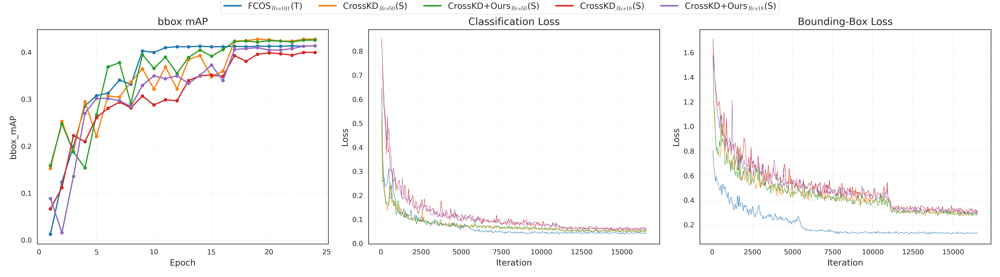

plot curve of work_dirs/fcos_r101-caffe_fpn_gn-head-1x_coco/20250801_203821_exp_2/vis_data/20250801_203821.json, metric is bbox_mAP
plot curve of work_dirs/crosskd_r50_fcos_r50-2x-ms_pp4av/20250731_163509_exp_2/vis_data/20250731_163509.json, metric is bbox_mAP
plot curve of work_dirs/crosskd_r50_fcos_pp4av/20250730_190221_exp_2/vis_data/20250730_190221.json, metric is bbox_mAP
plot curve of work_dirs/crosskd_r18_fcos/20250801_102350_exp_2/vis_data/20250801_102350.json, metric is bbox_mAP
plot curve of work_dirs/crosskd_r18_fcos_mc/20250801_102445_exp_2/vis_data/20250801_102445.json, metric is bbox_mAP
plot curve of work_dirs/fcos_r101-caffe_fpn_gn-head-1x_coco/20250801_203821_exp_2/vis_data/20250801_203821.json, metric is loss_cls
plot curve of work_dirs/crosskd_r50_fcos_r50-2x-ms_pp4av/20250731_163509_exp_2/vis_data/20250731_163509.json, metric is loss_cls
plot curve of work_dirs/crosskd_r50_fcos_pp4av/20250730_190221_exp_2/vis_data/20250730_190221.json, metric is loss_cls
plot curve 

In [92]:
%matplotlib notebook

json_logs = [fcos_101_2,crosskd_r50_2,crosskd_uwkd_r50_2, crosskd_r18_2, crosskd_uwkd_r18_2] 
legends = ['FCOS$_{Res101}$(T)', 'CrossKD$_{Res50}$(S)','CrossKD+Ours$_{Res50}$(S)','CrossKD$_{Res18}$(S)', 'CrossKD+Ours$_{Res18}$(S)']

# plot_individual_keys(json_logs, legends)
# plot_keys(json_logs, legends)
plot_all_metrics(json_logs, legends)

==> Plotting yolox_runs ...


<IPython.core.display.Javascript object>


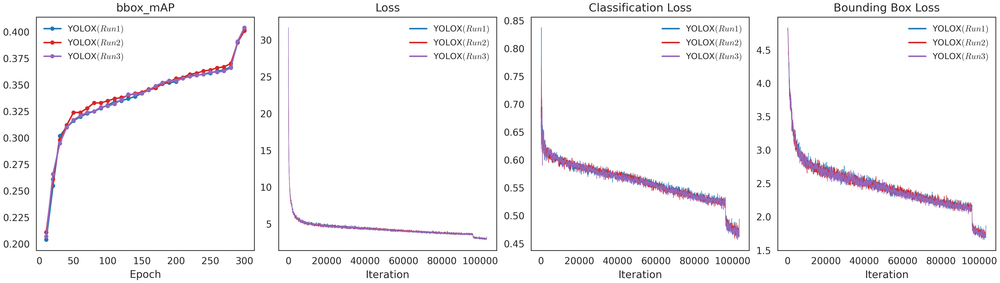

plot curve of /Ziob/343312/mmdetection/work_dirs/yolox_s_8xb8-300e_coco/20250806_102459_exp_300_1/vis_data/20250806_102459.json, metric is bbox_mAP
plot curve of /Ziob/343312/mmdetection/work_dirs/yolox_s_8xb8-300e_coco/20250807_111249_exp_300_2/vis_data/20250807_111249.json, metric is bbox_mAP
plot curve of /Ziob/343312/mmdetection/work_dirs/yolox_s_8xb8-300e_coco/20250808_060945_exp_300_3//vis_data/20250808_060945.json, metric is bbox_mAP
plot curve of /Ziob/343312/mmdetection/work_dirs/yolox_s_8xb8-300e_coco/20250806_102459_exp_300_1/vis_data/20250806_102459.json, metric is loss
plot curve of /Ziob/343312/mmdetection/work_dirs/yolox_s_8xb8-300e_coco/20250807_111249_exp_300_2/vis_data/20250807_111249.json, metric is loss
plot curve of /Ziob/343312/mmdetection/work_dirs/yolox_s_8xb8-300e_coco/20250808_060945_exp_300_3//vis_data/20250808_060945.json, metric is loss
plot curve of /Ziob/343312/mmdetection/work_dirs/yolox_s_8xb8-300e_coco/20250806_102459_exp_300_1/vis_data/20250806_102459

<IPython.core.display.Javascript object>


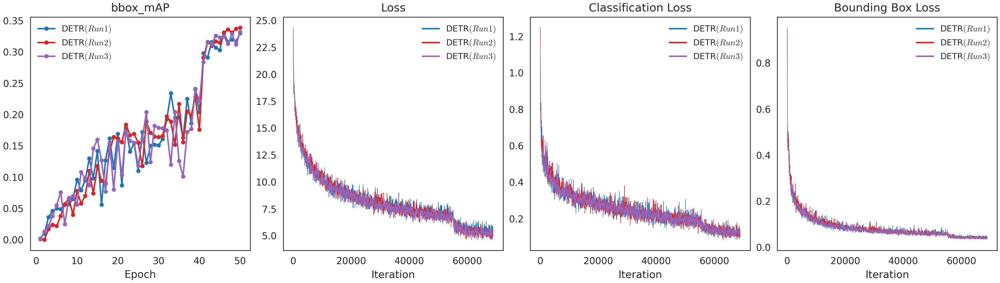

plot curve of /Ziob/343312/mmdetection/work_dirs/deformable-detr_r50_16xb2-50e_coco/20250724_010733_exp_1/vis_data/20250724_010733.json, metric is bbox_mAP
plot curve of /Ziob/343312/mmdetection/work_dirs/deformable-detr_r50_16xb2-50e_coco/20250802_193703_exp_2/vis_data/20250802_193703.json, metric is bbox_mAP
plot curve of /Ziob/343312/mmdetection/work_dirs/deformable-detr_r50_16xb2-50e_coco/20250803_115940_exp_3/vis_data/20250803_115940.json, metric is bbox_mAP
plot curve of /Ziob/343312/mmdetection/work_dirs/deformable-detr_r50_16xb2-50e_coco/20250724_010733_exp_1/vis_data/20250724_010733.json, metric is loss
plot curve of /Ziob/343312/mmdetection/work_dirs/deformable-detr_r50_16xb2-50e_coco/20250802_193703_exp_2/vis_data/20250802_193703.json, metric is loss
plot curve of /Ziob/343312/mmdetection/work_dirs/deformable-detr_r50_16xb2-50e_coco/20250803_115940_exp_3/vis_data/20250803_115940.json, metric is loss
plot curve of /Ziob/343312/mmdetection/work_dirs/deformable-detr_r50_16xb2-5

In [128]:
t_groups = [
#     ("fcos_r101_runs",
#      [fcos_101_1, fcos_101_2, fcos_101_3],
#      legends_fcos),
    
#     ("ld_r50_runs",
#      [ld_r50_1, ld_r50_2, ld_r50_3],
#      legends_ld_r50),
    ("yolox_runs", [yolox_1, yolox_2, yolox_3], legends_yolox),
    ("detr_runs",  [detr_1,  detr_2,  detr_3 ], legends_detr),
    
]
s_groups = [
    ("crosskd_r50_runs",
     [crosskd_r50_1, crosskd_r50_2, crosskd_r50_3],
     legends_crosskd_r50),

#     ("crosskd_uwkd_r50_runs",
#      [crosskd_uwkd_r50_1, crosskd_uwkd_r50_2, crosskd_uwkd_r50_3],
#      legends_crosskd_uwkd_r50),


#     ("crosskd_pkd_r50_runs",
#      [crosskd_pkd_r50_1, crosskd_pkd_r50_2, crosskd_pkd_r50_3],
#      legends_crosskd_pkd_r50),

#     ("crosskd_r18_runs",
#      [crosskd_r18_1, crosskd_r18_2, crosskd_r18_3],
#      legends_crosskd_r18),

#     ("crosskd_uwkd_r18_runs",
#      [crosskd_uwkd_r18_1, crosskd_uwkd_r18_2, crosskd_uwkd_r18_3],
#      legends_crosskd_uwkd_r18),
]

for out_path, logs, legends in t_groups:
    print(f"==> Plotting {out_path} ...")
    plot_keys(logs, legends, out_path=out_path)

# for out_path, logs, legends in s_groups:
#     print(f"==> Plotting {out_path} ...")
#     plot_keys_student(logs, legends, out_path=out_path)

In [90]:
import json

def find_loss_outliers(json_path, loss_key="loss", threshold=None):
    max_val = -float("inf")
    max_record = None
    values = []

    with open(json_path, "r") as f:
        for line in f:
            data = json.loads(line.strip())
            if loss_key in data:
                val = data[loss_key]
                values.append((data.get("epoch", None), data.get("step", None), val))
                if val > max_val:
                    max_val = val
                    max_record = (data.get("epoch", None), data.get("step", None), val)

    if threshold is not None:
        # Print all outliers above threshold
        outliers = [rec for rec in values if rec[2] > threshold]
        print(f"Found {len(outliers)} outliers with {loss_key} > {threshold}:")
        for o in outliers:
            print(f"Epoch {o[0]}, Step {o[1]}, {loss_key}={o[2]:.4f}")
    else:
        print(f"Max {loss_key}: {max_val:.4f} at Epoch {max_record[0]}, Step {max_record[1]}")

# Example:
find_loss_outliers(
    "work_dirs/crosskd_r50_fcos_r50-2x-ms_pp4av/20250731_163509_exp_2/vis_data/20250731_163509.json",
    loss_key="loss",
    threshold=1000  # optional, set if you want to find all above a limit
)


Found 1 outliers with loss > 1000:
Epoch 22, Step 14640, loss=563028.4120


In [144]:
import matplotlib as mpl
import matplotlib.pyplot as plt
from cycler import cycler
from types import SimpleNamespace

run_colors = mpl.colormaps['tab10'].colors[:10]
mpl.rcParams.update({
    "figure.dpi": 150,
    "savefig.dpi": 600,
    "font.family": "serif",   # e.g., Times New Roman
    "font.size": 11,
    "axes.titlesize": 12,
    "axes.labelsize": 11,
    "xtick.labelsize": 10,
    "ytick.labelsize": 10,
    "legend.fontsize": 9,
    "axes.spines.top": False,
    "axes.spines.right": False,
    "axes.grid": True,
    "grid.linestyle": ":",
    "grid.alpha": 0.4,
    "lines.linewidth": 1.6,
    "lines.markersize": 4,
    "pdf.fonttype": 42,  # Embed TrueType fonts
    "ps.fonttype": 42,
    "axes.prop_cycle": cycler(color=run_colors)  # blue, red, purple
})

def _epochs_with_metric(d, metric="bbox_mAP"):
    return sorted([e for e in d.keys() if metric in d[e] and d[e][metric]])

def _common_map_epoch(log_dicts, metric="bbox_mAP"):
    sets = []
    for d in log_dicts:
        es = _epochs_with_metric(d, metric)
        if not es:
            return None
        sets.append(set(es))
    inter = set.intersection(*sets)
    return min(inter) if inter else None

def plot_keys(json_logs, legends, out_path="training_curves"):
    keys    = ["bbox_mAP", "loss", "loss_cls", "loss_bbox"]
    titles  = ["bbox_mAP", "Loss", "Classification Loss", "Bounding Box Loss"]
    xlabels = ["Epoch", "Iteration", "Iteration", "Iteration"]

    fig, axes = plt.subplots(1, len(keys), figsize=(14.8, 4.2), constrained_layout=True)
    log_dicts = load_json_logs(json_logs)

    # Panel 1: bbox_mAP
    common_ep = _common_map_epoch(log_dicts, "bbox_mAP")
    if common_ep is not None:
        args = SimpleNamespace(
            json_logs=json_logs, keys=["bbox_mAP"],
            start_epoch="0", eval_interval=str(common_ep),
            title=titles[0], legend=legends,
            backend=None, style="white", out=None
        )
        plt.sca(axes[0]); plot_curve(log_dicts, args)
        axes[0].set_xlabel(xlabels[0])
        axes[0].legend(frameon=False, loc="best", ncol=1)

    # Other panels
    for i, (key, title, xlabel) in enumerate(zip(keys[1:], titles[1:], xlabels[1:]), start=1):
        args = SimpleNamespace(
            json_logs=json_logs, keys=[key],
            start_epoch="0", eval_interval="1",
            title=title, legend=legends,
            backend=None, style="white", out=None
        )
        plt.sca(axes[i]); plot_curve(log_dicts, args)
        axes[i].set_xlabel(xlabel)
        leg = axes[i].legend(frameon=False, loc="best", ncol=1)
        for line in leg.get_lines():
            line.set_linewidth(1.6)

    # Save in high quality
    fig.savefig(f"{out_path}.png", bbox_inches="tight", dpi=300)
    fig.savefig(f"{out_path}.pdf", bbox_inches="tight")
    plt.show()


<IPython.core.display.Javascript object>


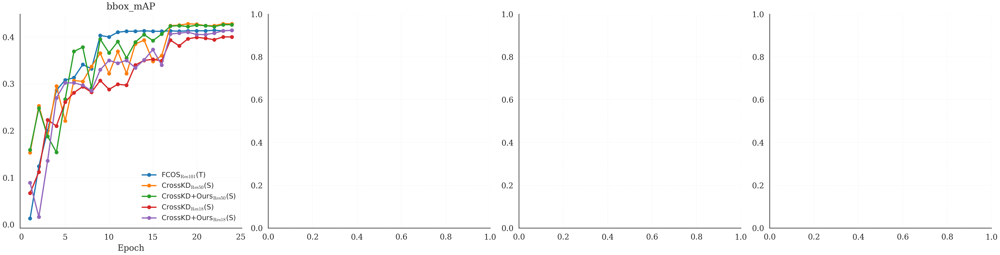

plot curve of work_dirs/fcos_r101-caffe_fpn_gn-head-1x_coco/20250801_203821_exp_2/vis_data/20250801_203821.json, metric is bbox_mAP
plot curve of work_dirs/crosskd_r50_fcos_r50-2x-ms_pp4av/20250731_163509_exp_2/vis_data/20250731_163509.json, metric is bbox_mAP
plot curve of work_dirs/crosskd_r50_fcos_pp4av/20250730_190221_exp_2/vis_data/20250730_190221.json, metric is bbox_mAP
plot curve of work_dirs/crosskd_r18_fcos/20250801_102350_exp_2/vis_data/20250801_102350.json, metric is bbox_mAP
plot curve of work_dirs/crosskd_r18_fcos_mc/20250801_102445_exp_2/vis_data/20250801_102445.json, metric is bbox_mAP


AssertionError: 

In [145]:
# teacher is first; students follow
teacher_log = fcos_101_2
student_logs = [crosskd_r50_2, crosskd_uwkd_r50_2, crosskd_r18_2, crosskd_uwkd_r18_2]

legends_all = [
    r"FCOS$_{\mathrm{Res101}}$(T)",
    r"CrossKD$_{\mathrm{Res50}}$(S)",
    r"CrossKD+Ours$_{\mathrm{Res50}}$(S)",
    r"CrossKD$_{\mathrm{Res18}}$(S)",
    r"CrossKD+Ours$_{\mathrm{Res18}}$(S)",
]

plot_teacher_student(
    teacher_log,
    student_logs,
    legends_all,
    teacher_name_for_losses=r"FCOS$_{\mathrm{Res101}}$(T)",
    out_path="teacher_student_metrics"
)


### training performance  

fcos is the fastest to train per iteration (0.5889 s) and crosskd is the slowest (0.9649 s), but crosskd gives significantly better accuracy.

fcos and ld have low standard deviations (0.0010 and 0.0011), indicating consistent iteration time.





| Model (Directory)       | Avg Iter Time | Fastest Epoch      | Slowest Epoch       | Time Std (s) |
| ----------------------- | ------------- | ------------------ | ------------------- | ------------ |
| `crosskd` | **0.9649 s**  | 0.9565 s (Epoch 9) | 0.9702 s (Epoch 8)  | 0.0034       |
| `fcos`   | **0.5889 s**  | 0.5850 s (Epoch 1) | 0.5904 s (Epoch 18) | 0.0010       |
| `ld`     | **0.8329 s**  | 0.7892 s (Epoch 21) | 0.8647 s (Epoch 3) | 0.0347       |
| `crsskd_pkd`|**0.9815 s**  |0.9757 s(Epoch 8) | 0.9861 s (epoch 11) | 0.0026 |
|`crosskd_r18`|**1.3013** | 1.2968 s(Epoch 1) | 1.3054 s(Epoch 23) | 0.0022|




In [18]:
args = SimpleNamespace(
    json_logs=[crosskd,fcos,ld, crosskd_pkd, crosskd_r18],
    include_outliers=False
)
log_dicts = load_json_logs(args.json_logs)
cal_train_time(log_dicts, args)

FileNotFoundError: [Errno 2] No such file or directory: 'work_dirs/crosskd_r50_fcos_r101-2x-ms_caffe_fpn_gn-head_2x_ms_coco/best/vis_data/20250526_091450.json'

### benchmark  

run 100 times for each model. CrossKd has good speed (fast FPS and batch time), but memory usage; Fcos(teacher) is most memory-efficient (lowest memory), and lightly slower at FPS than student models.


| Model      | Average fps (img/s) | Average time per batch (ms) | Memory used (GB) | Unique Set Size (uss, GB) | Proportional Set Size (pss, GB) |
|------------|---------------------|------------------------------|-------------------|-----------------------------|----------------------------------|
| fcos       | 6.8                 | 147.7                        | 18.37             | 0.23     | 0.38       |
| fcos_t     | 7.2                 | 143.7                        | 10.56             | 0.13     | 0.27       |
| crosskd    | 6.7                 | 149.8                        | 18.04             | 0.23     | 0.39       |
| ld         | 6.7                 | 151.8                        | 18.37             | 0.24     | 0.39       |
| crosskd_pkd| 6.6                 | 153.4                        | 21.00             | 0.21     | 0.36       |
| crosskd_r18| 6.8                 | 148.6                        | 21.77             | 0.25     | 0.40       |


In [22]:
# fcos
! python tools/analysis_tools/benchmark.py configs/fcos/fcos_r101-caffe_fpn_gn-head-1x_coco.py --checkpoint work_dirs/fcos_r101-caffe_fpn_gn-head-1x_coco/exp_2/epoch_24.pth --repeat-num 10

08/08 23:43:57 - mmengine - INFO - before build: 
08/08 23:43:57 - mmengine - INFO - (GB) mem_used: 4.16 | uss: 0.24 | pss: 0.24 | total_proc: 1
08/08 23:43:59 - mmengine - WARNING - "FileClient" will be deprecated in future. Please use io functions in https://mmengine.readthedocs.io/en/latest/api/fileio.html#file-io
08/08 23:43:59 - mmengine - WARNING - "HardDiskBackend" is the alias of "LocalBackend" and the former will be deprecated in future.
loading annotations into memory...
Done (t=0.10s)
creating index...
index created!
08/08 23:43:59 - mmengine - INFO - after build: 
08/08 23:43:59 - mmengine - INFO - (GB) mem_used: 4.17 | uss: 0.25 | pss: 0.25 | total_proc: 1
08/08 23:44:17 - mmengine - INFO - ==================================
08/08 23:44:17 - mmengine - INFO - Done batch [50 /2000], fps: 3.0 batch/s, times per batch: 337.5 ms/batch, batch size: 8, num_workers: 2
08/08 23:44:17 - mmengine - INFO - (GB) mem_used: 4.32 | uss: 0.23 | pss: 0.35 | total_proc: 3
08/08 23:44:41 - m

In [14]:
# cross+uet
! python tools/analysis_tools/benchmark.py configs/crosskd/crosskd_r50_fcos_pp4av.py --checkpoint work_dirs/crosskd_r50_fcos_pp4av/exp_2/epoch_24.pth --repeat-num 10

08/08 17:21:57 - mmengine - INFO - before build: 
08/08 17:21:57 - mmengine - INFO - (GB) mem_used: 9.07 | uss: 0.24 | pss: 0.24 | total_proc: 1
08/08 17:21:57 - mmengine - WARNING - "FileClient" will be deprecated in future. Please use io functions in https://mmengine.readthedocs.io/en/latest/api/fileio.html#file-io
08/08 17:21:57 - mmengine - WARNING - "HardDiskBackend" is the alias of "LocalBackend" and the former will be deprecated in future.
loading annotations into memory...
Done (t=0.03s)
creating index...
index created!
08/08 17:21:57 - mmengine - INFO - after build: 
08/08 17:21:57 - mmengine - INFO - (GB) mem_used: 9.11 | uss: 0.25 | pss: 0.25 | total_proc: 1
08/08 17:22:03 - mmengine - INFO - ==================================
08/08 17:22:03 - mmengine - INFO - Done batch [50 /2000], fps: 8.5 batch/s, times per batch: 117.2 ms/batch, batch size: 8, num_workers: 2
08/08 17:22:03 - mmengine - INFO - (GB) mem_used: 9.18 | uss: 0.21 | pss: 0.35 | total_proc: 3
08/08 17:22:14 - m

In [3]:
# crosskd
! python tools/analysis_tools/benchmark.py configs/crosskd/crosskd_r50_fcos_r50-2x-ms_pp4av.py --checkpoint work_dirs/crosskd_r50_fcos_r50-2x-ms_pp4av/exp_2/epoch_24.pth --repeat-num 10

08/08 14:44:53 - mmengine - INFO - before build: 
08/08 14:44:53 - mmengine - INFO - (GB) mem_used: 8.80 | uss: 0.24 | pss: 0.24 | total_proc: 1
08/08 14:44:55 - mmengine - WARNING - "FileClient" will be deprecated in future. Please use io functions in https://mmengine.readthedocs.io/en/latest/api/fileio.html#file-io
08/08 14:44:55 - mmengine - WARNING - "HardDiskBackend" is the alias of "LocalBackend" and the former will be deprecated in future.
loading annotations into memory...
Done (t=0.18s)
creating index...
index created!
08/08 14:44:55 - mmengine - INFO - after build: 
08/08 14:44:55 - mmengine - INFO - (GB) mem_used: 8.75 | uss: 0.25 | pss: 0.25 | total_proc: 1
08/08 14:45:02 - mmengine - INFO - ==================================
08/08 14:45:02 - mmengine - INFO - Done batch [50 /2000], fps: 8.5 batch/s, times per batch: 118.0 ms/batch, batch size: 8, num_workers: 2
08/08 14:45:02 - mmengine - INFO - (GB) mem_used: 8.96 | uss: 0.20 | pss: 0.33 | total_proc: 3
08/08 14:45:13 - m

In [20]:
# ld 
! python tools/analysis_tools/benchmark.py configs/ld/ld_r50_pp4av.py --checkpoint work_dirs/ld_r50_pp4av/exp_2/epoch_24.pth --repeat-num 10

08/08 18:03:28 - mmengine - INFO - before build: 
08/08 18:03:28 - mmengine - INFO - (GB) mem_used: 9.05 | uss: 0.24 | pss: 0.24 | total_proc: 1
08/08 18:03:29 - mmengine - WARNING - "FileClient" will be deprecated in future. Please use io functions in https://mmengine.readthedocs.io/en/latest/api/fileio.html#file-io
08/08 18:03:29 - mmengine - WARNING - "HardDiskBackend" is the alias of "LocalBackend" and the former will be deprecated in future.
loading annotations into memory...
Done (t=0.11s)
creating index...
index created!
08/08 18:03:30 - mmengine - INFO - after build: 
08/08 18:03:30 - mmengine - INFO - (GB) mem_used: 8.92 | uss: 0.25 | pss: 0.25 | total_proc: 1
08/08 18:03:49 - mmengine - INFO - ==================================
08/08 18:03:49 - mmengine - INFO - Done batch [50 /2000], fps: 2.7 batch/s, times per batch: 374.4 ms/batch, batch size: 8, num_workers: 2
08/08 18:03:49 - mmengine - INFO - (GB) mem_used: 9.21 | uss: 0.20 | pss: 0.34 | total_proc: 3
08/08 18:04:10 - m

In [21]:
# crosskd pkd
! python tools/analysis_tools/benchmark.py configs/crosskd+pkd/crosskd+pkd_r50_fcos_r101-2x_coco.py --checkpoint  work_dirs/crosskd+pkd_r50_fcos_r101-2x_coco/exp_2/epoch_24.pth --repeat-num 10

08/08 18:05:58 - mmengine - INFO - before build: 
08/08 18:05:58 - mmengine - INFO - (GB) mem_used: 8.71 | uss: 0.24 | pss: 0.24 | total_proc: 1
08/08 18:05:58 - mmengine - WARNING - "FileClient" will be deprecated in future. Please use io functions in https://mmengine.readthedocs.io/en/latest/api/fileio.html#file-io
08/08 18:05:58 - mmengine - WARNING - "HardDiskBackend" is the alias of "LocalBackend" and the former will be deprecated in future.
loading annotations into memory...
Done (t=0.03s)
creating index...
index created!
08/08 18:05:59 - mmengine - INFO - after build: 
08/08 18:05:59 - mmengine - INFO - (GB) mem_used: 8.75 | uss: 0.25 | pss: 0.25 | total_proc: 1
08/08 18:06:05 - mmengine - INFO - ==================================
08/08 18:06:05 - mmengine - INFO - Done batch [50 /2000], fps: 8.0 batch/s, times per batch: 124.9 ms/batch, batch size: 8, num_workers: 2
08/08 18:06:05 - mmengine - INFO - (GB) mem_used: 9.10 | uss: 0.20 | pss: 0.34 | total_proc: 3
08/08 18:06:16 - m

In [25]:
# crosskd r18 

! python tools/analysis_tools/benchmark.py configs/crosskd/crosskd_r18_fcos.py --checkpoint  work_dirs/crosskd_r18_fcos/exp_2/epoch_24.pth --repeat-num 10

08/09 00:05:43 - mmengine - INFO - before build: 
08/09 00:05:43 - mmengine - INFO - (GB) mem_used: 4.39 | uss: 0.24 | pss: 0.24 | total_proc: 1
08/09 00:05:44 - mmengine - WARNING - "FileClient" will be deprecated in future. Please use io functions in https://mmengine.readthedocs.io/en/latest/api/fileio.html#file-io
08/09 00:05:44 - mmengine - WARNING - "HardDiskBackend" is the alias of "LocalBackend" and the former will be deprecated in future.
loading annotations into memory...
Done (t=0.06s)
creating index...
index created!
08/09 00:05:44 - mmengine - INFO - after build: 
08/09 00:05:44 - mmengine - INFO - (GB) mem_used: 4.40 | uss: 0.25 | pss: 0.25 | total_proc: 1
08/09 00:05:49 - mmengine - INFO - ==================================
08/09 00:05:49 - mmengine - INFO - Done batch [50 /2000], fps: 9.3 batch/s, times per batch: 108.0 ms/batch, batch size: 8, num_workers: 2
08/09 00:05:50 - mmengine - INFO - (GB) mem_used: 4.58 | uss: 0.22 | pss: 0.35 | total_proc: 3
08/09 00:05:59 - m

In [26]:
# crosskd uet r18 

! python tools/analysis_tools/benchmark.py configs/crosskd/crosskd_r18_fcos_mc.py --checkpoint  work_dirs/crosskd_r18_fcos_mc/exp_2/epoch_24.pth --repeat-num 10

08/09 00:07:25 - mmengine - INFO - before build: 
08/09 00:07:25 - mmengine - INFO - (GB) mem_used: 4.36 | uss: 0.24 | pss: 0.25 | total_proc: 1
08/09 00:07:26 - mmengine - WARNING - "FileClient" will be deprecated in future. Please use io functions in https://mmengine.readthedocs.io/en/latest/api/fileio.html#file-io
08/09 00:07:26 - mmengine - WARNING - "HardDiskBackend" is the alias of "LocalBackend" and the former will be deprecated in future.
loading annotations into memory...
Done (t=0.02s)
creating index...
index created!
08/09 00:07:26 - mmengine - INFO - after build: 
08/09 00:07:26 - mmengine - INFO - (GB) mem_used: 4.37 | uss: 0.25 | pss: 0.25 | total_proc: 1
08/09 00:07:31 - mmengine - INFO - ==================================
08/09 00:07:31 - mmengine - INFO - Done batch [50 /2000], fps: 9.1 batch/s, times per batch: 109.8 ms/batch, batch size: 8, num_workers: 2
08/09 00:07:31 - mmengine - INFO - (GB) mem_used: 4.52 | uss: 0.23 | pss: 0.36 | total_proc: 3
08/09 00:07:41 - m